# Non-classical Monocytes in Lupus Cross Condition Analysis

In [1]:
import plotnine as pn
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import partipy as pt
import decoupler as dc
import pickle

First, we load the AnnData object containing 47819 hepatocytes and 30867 genes

In [ ]:
adata = sc.read_h5ad( "Data/adata_ncM.h5ad")
# adata = sc.read_h5ad( "DataAnalysis/adata_ncMRun.h5ad")
adata

AnnData object with n_obs × n_vars = 47819 × 18496
    obs: 'library_uuid', 'author_cell_type', 'sample_uuid', 'disease_state', 'donor_id', 'Processing_Cohort', 'ct_cov', 'ind_cov', 'cell_type', 'assay', 'disease', 'sex', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'Status', 'flare_status'
    var: 'feature_is_filtered', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'AA_bootstrap', 'AA_config', 'AA_metrics', 'AA_results', 'Status_colors', 'flare_status_colors', 'hvg', 'log1p', 'pca'
    obsm: 'X_pca', 'cell_weights'
    varm: 'PCs'
    layers: 'z_scaled'

In [3]:
sc.pp.filter_genes(adata, min_cells=3)
print(f"Number of cells after filtering of low quality cells: {adata.n_obs} \nNumber of genes after filtering of low quality genes: {adata.n_vars}")

Number of cells after filtering of low quality cells: 47819 
Number of genes after filtering of low quality genes: 18496


## Preprocessing


The initial step of the partipy pipeline involves data preprocessing. Genes that appear in fewer than three cells are already excluded. Following this, the data must be normalized:

In [4]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

Then we find the highly variable genes (hvg):

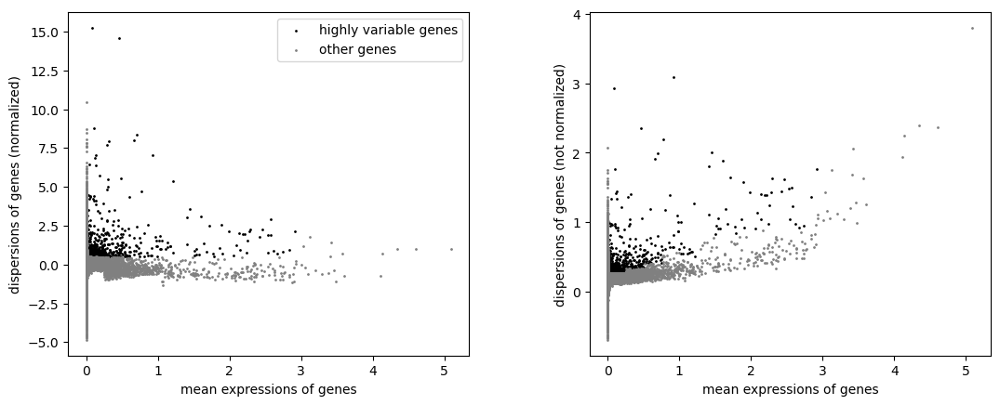

In [5]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

Lastly, the data is z-scaled and saved in a seperate layer, which is needed later for enrichment analysis.

In [20]:
adata.layers["z_scaled"]= sc.pp.scale(adata.X.copy(), max_value=10)

## Dimensionality Reduction

Using these hvg, PCA is then performed.

In [6]:
sc.pp.pca(adata, mask_var="highly_variable")

To facilitate visualization of the cells based on their flare status, a new column is added to the AnnData object. The PCA results are then:

... storing 'flare_status' as categorical


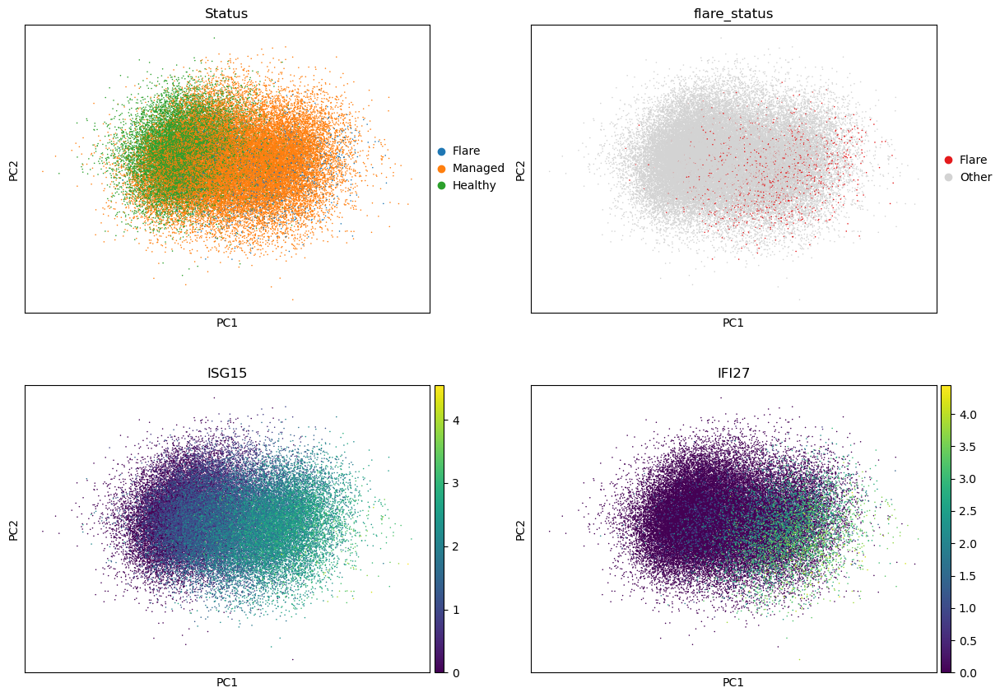

In [4]:
# To visualize cells in the PCA results with the flare status:
adata.obs['flare_status'] = ['Flare' if s == 'Flare' else 'Other' for s in adata.obs['Status']]
adata.uns["flare_status_colors"] = ["#E41A1C", "#D3D3D3"]
sc.pl.pca_scatter(adata, size = 5, color=["Status", "flare_status", "ISG15", "IFI27"], ncols=2, use_raw=False)

The first row of PCA plots displays cells colored by patient condition, providing an overview of sample distribution. Cells from patients with managed lupus are relatively evenly dispersed across the PCA space. In contrast, healthy donor cells are predominantly located on the left end of PC1, while flare-associated cells cluster toward the right end, suggesting distinct transcriptional profiles linked to disease status.

In plots three and four, gene expression levels are projected onto the PCA for interferon-induced genes that are enriched in the lower-right region.

The variance explained by the PCA guides the selection of the number of dimensions for downstream analyses.

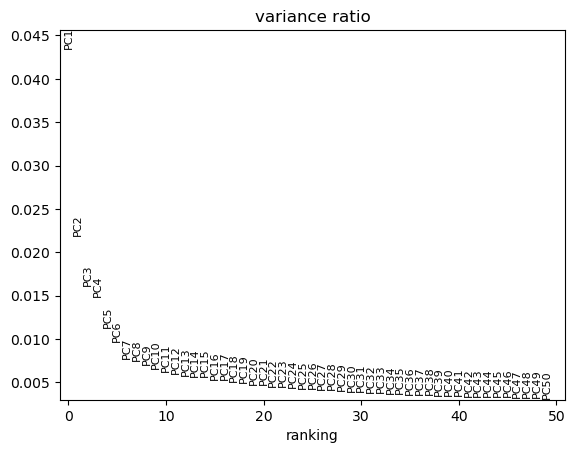

In [10]:
sc.pl.pca_variance_ratio(adata, n_pcs=50)

I choose the number of principal components (PCs) based on the point at which the explained variance begins to plateau—indicating diminishing returns from additional components. In this case, I select the first 7 PCs, as they capture the majority of variance before the curve flattens. This choice is stored as part of the archetypal analysis (AA) configuration settings in the AnnData object for downstream analyses.

In [ ]:
pt.set_obsm(adata=adata, obsm_key="X_pca", n_dimensions=7)

## Select Number of Archetypes

The next step is to find out how many archetypes the polytope has. To do this, the explained variance and an information criteria (IC) are calculated for a range of archetypes (two to ten). The results show the trend of both metrics over the tested range of archetypes:

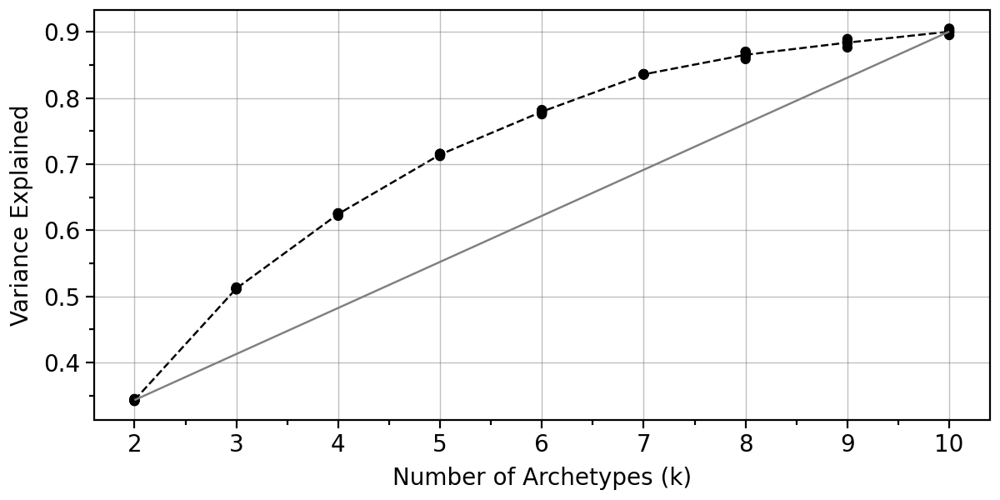

In [ ]:
pt.compute_selection_metrics(adata=adata, min_a=2, max_a=10)
pt.plot_var_explained(adata)

Here we are looking for the point beyond which adding more archetypes yields minimal gains. This corresponds to the "elbow" of the curve, where the rate of increase in explained variance begins to plateau.
To assist in identifying this point, a grey reference line is plotted. The elbow is defined as the point furthest from its orthogonal projection onto this line, capturing the point of maximum curvature.

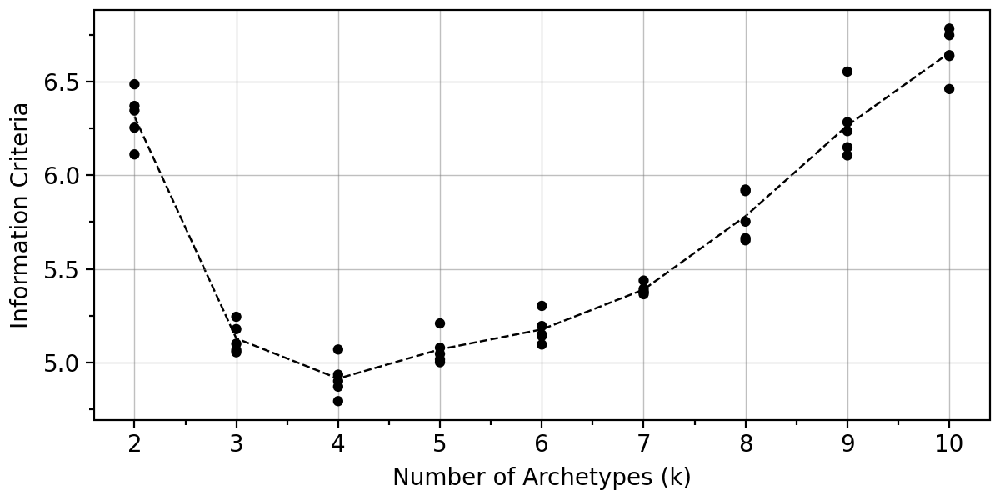

In [7]:
pt.plot_IC(adata)

Plausible candidates exhibit a low IC. Based on both the explained variance and IC analyses, the most plausible solutions involve three, four, five or six archetypes.

To assess which of these represents the most robust solution, we evaluate archetype stability by performing bootstrapping with replacement on the dataset and measuring the variance of the inferred archetypes across resampled datasets.

In [14]:
pt.bootstrap_aa(adata=adata, n_bootstrap=100, n_archetypes_list=range(2, 8))

There are two implemented approaches to visualizing the stability of the archetypes:
1. **Archetype Position Plots** (2D and 3D): The positions of the archetypes inferred from both the original and bootstrapped datasets are visualized in principal component space (2D and 3D). This allows to assess the spatial consistency of archetypes across resamplings—robust archetypes will cluster tightly in these plots.

In [15]:
# This cannot rendered in the GitHub preview!
pt.plot_bootstrap_3D(adata, n_archetypes=4)

2025-06-02 16:40:21 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


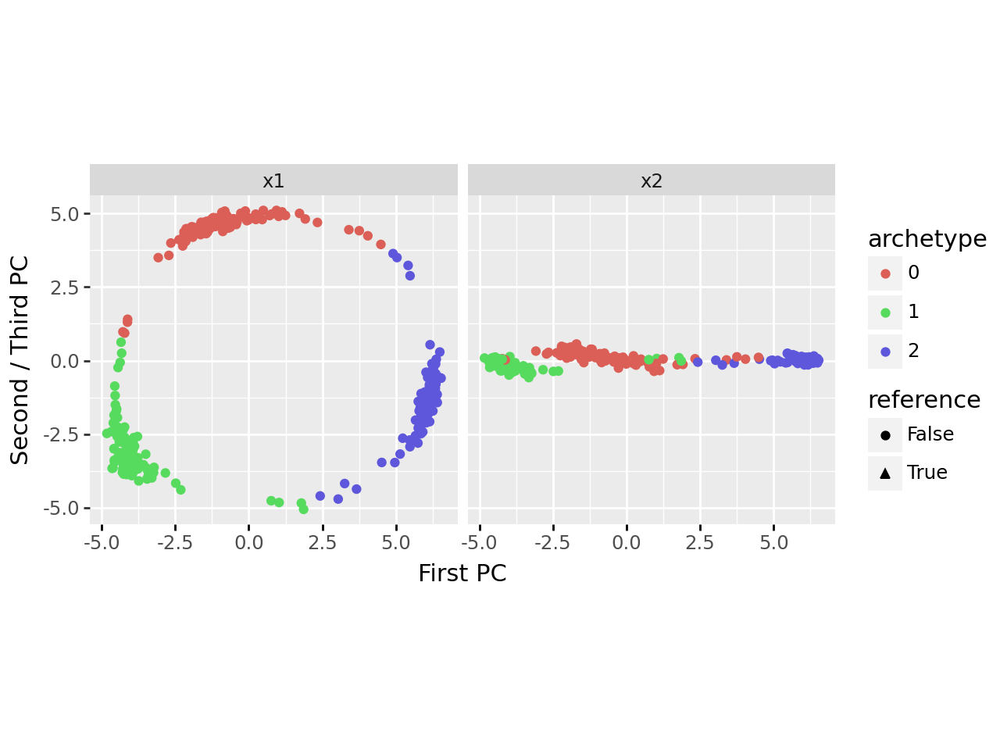

2025-06-02 16:40:21 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


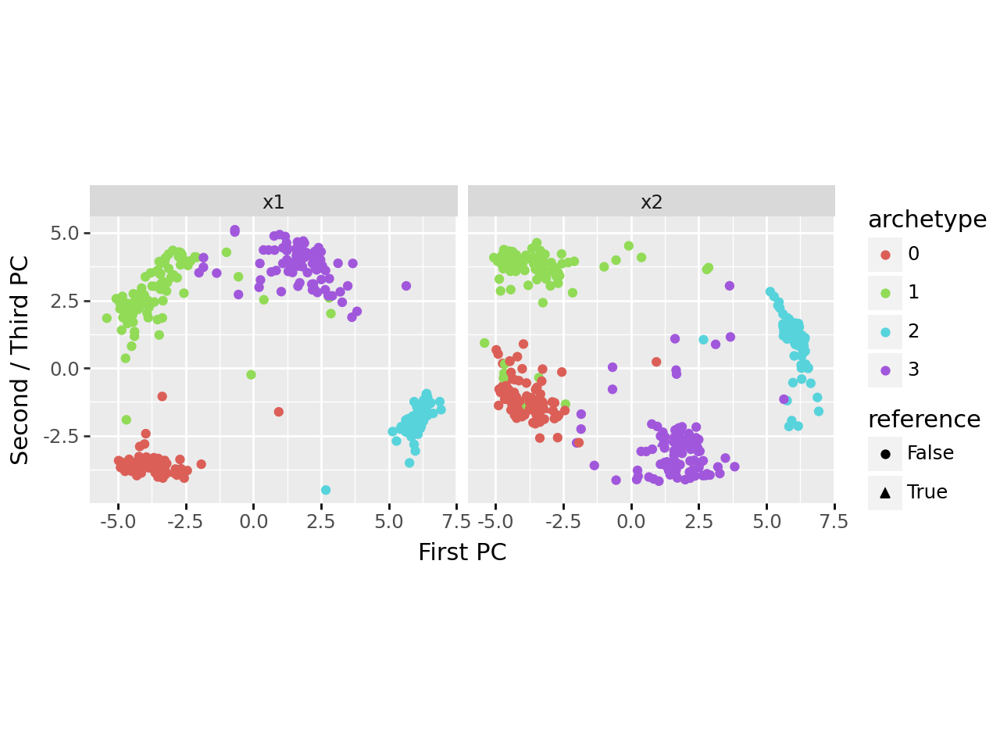

2025-06-02 16:40:22 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


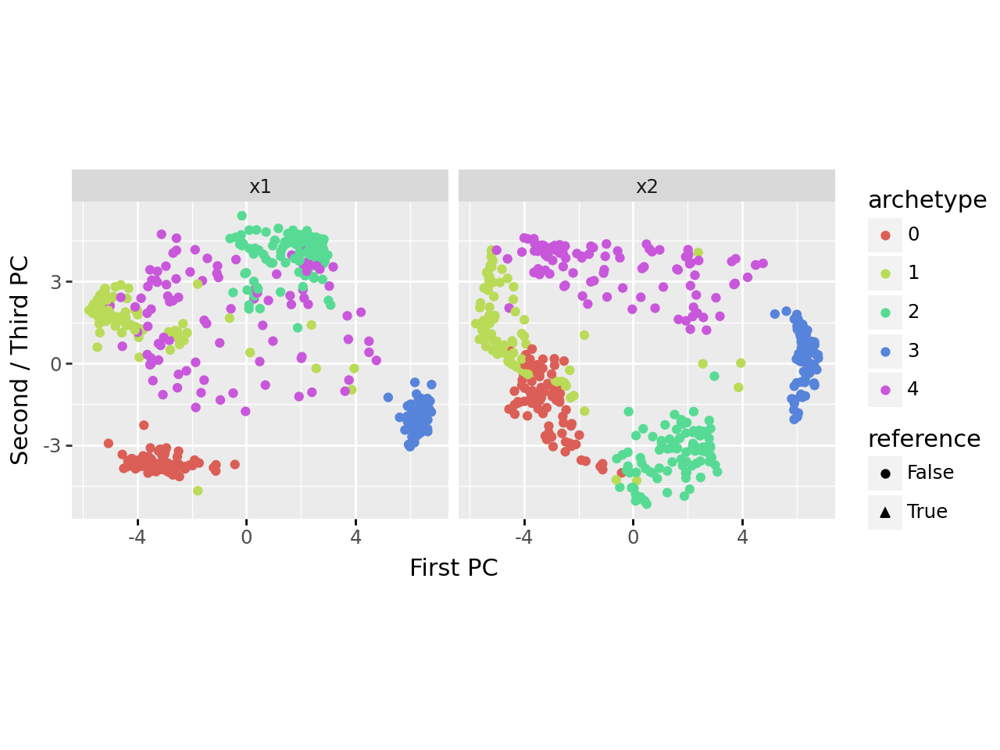

In [8]:
for i in range(3, 6):
    p = pt.plot_bootstrap_2D(adata, n_archetypes=i, show_two_panels=True)
    p.show()

2. **Variance Trend Plots**: The median and maximum positional variance of archetypes across bootstraps are plotted for each tested number of archetypes. The number of archetypes with the lowest variance indicates the most stable and robust solution, and can thus be easily identified from the plot.

2025-06-02 16:40:36 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


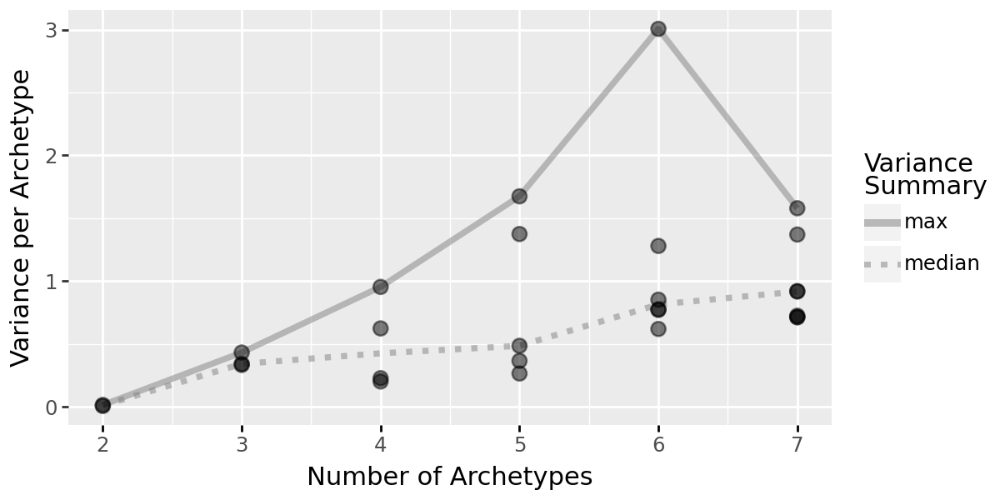

In [9]:
pt.plot_bootstrap_variance(adata)

Based on the results of the stability analysis, I select four archetypes for the AA, as this configuration demonstrated the highest robustness across bootstrapped datasets.

## Archetypal Analysis

Now that I decided on four archetypes, I can run AA and add the results to the AnnData object.

In [2]:
adata = sc.read_h5ad( "DataAnalysis/adata_ncMRun.h5ad")

iter: 69 | RSS: 125507.391 | rel_delta_RSS: -0.000076
Algorithm converged after 69 iterations.
iter: 117 | RSS: 126591.891 | rel_delta_RSS: -0.000025
Algorithm converged after 117 iterations.
iter: 56 | RSS: 125346.320 | rel_delta_RSS: -0.000096
Algorithm converged after 56 iterations.
iter: 49 | RSS: 125367.977 | rel_delta_RSS: -0.000051
Algorithm converged after 49 iterations.
iter: 52 | RSS: 125669.062 | rel_delta_RSS: -0.000072
Algorithm converged after 52 iterations.


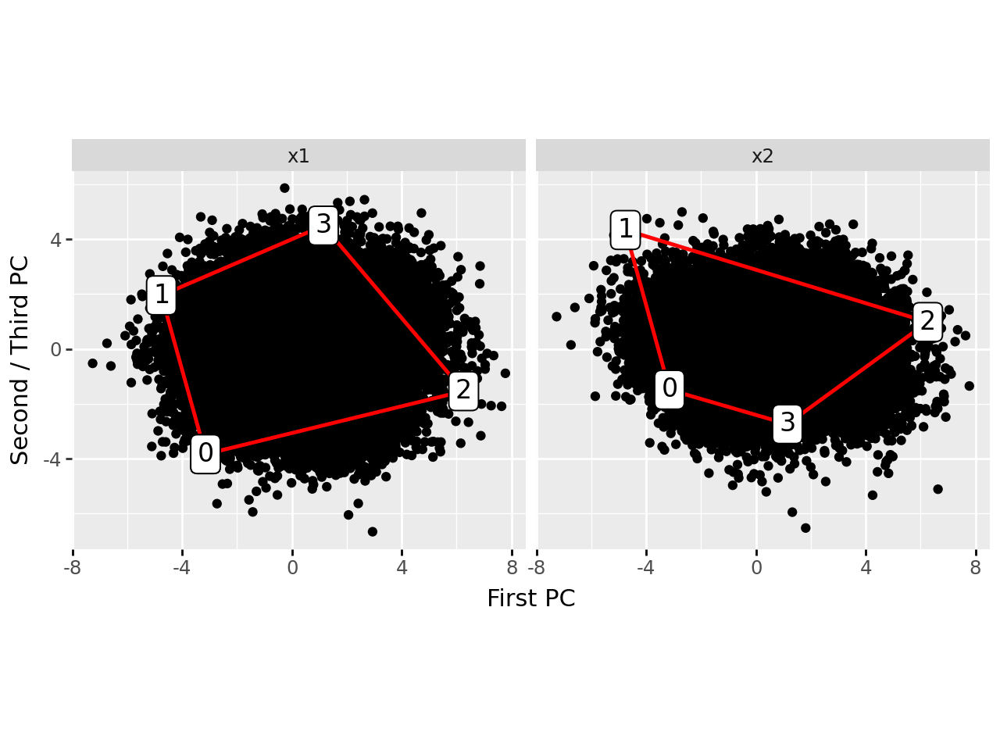

In [5]:
pt.compute_archetypes(adata, n_archetypes=4, verbose=True, archetypes_only=False)

pt.plot_archetypes_2D(adata=adata, show_two_panels=True)

In [6]:
adata.uns["AA_results"]

{'A': array([[0.66022074, 0.20328496, 0.        , 0.13649419],
        [0.3251513 , 0.17089173, 0.48649845, 0.01745838],
        [0.32926378, 0.24630626, 0.18869044, 0.2357394 ],
        ...,
        [0.06688493, 0.12155217, 0.5867127 , 0.22485007],
        [0.68877596, 0.02916372, 0.10840044, 0.17365974],
        [0.65482455, 0.        , 0.27735046, 0.06782489]], dtype=float32),
 'B': array([[0.000000e+00, 0.000000e+00, 0.000000e+00, ..., 0.000000e+00,
         0.000000e+00, 0.000000e+00],
        [0.000000e+00, 0.000000e+00, 0.000000e+00, ..., 0.000000e+00,
         0.000000e+00, 0.000000e+00],
        [0.000000e+00, 0.000000e+00, 0.000000e+00, ..., 5.243595e-06,
         0.000000e+00, 0.000000e+00],
        [0.000000e+00, 0.000000e+00, 0.000000e+00, ..., 0.000000e+00,
         0.000000e+00, 0.000000e+00]], dtype=float32),
 'Z': array([[-3.1502373 , -3.833709  , -1.4871823 , -0.8349607 ,  0.23665185,
          0.23840086, -0.17464305],
        [-4.7575617 ,  1.9525704 ,  4.333858  , 

## Identifying representative Cells for the Archetypes 

Since the goal is to perform gene expression enrichment analysis on the archetypes, a gene expression profile is constructed for each archetype. To do this, cells are weighted according to their proximity,  using a radial basis function (RBF) kernel, to each archetype in the reduced-dimensional space. Using these weights, and the z-scored gene expression matrix, a weighted average expression is computed for each gene—yielding the representative expression profile of each archetype.

In [2]:
adata = sc.read_h5ad("DataAnalysis/adata_ncMRun.h5ad")

In [3]:
pt.compute_archetype_weights(adata=adata, mode="automatic")
archetype_expression = pt.compute_archetype_expression(adata=adata, layer="z_scaled")

Applied length scale is 3.0518142203205745.


## Meta Categorical Enrichment of the Archetypes

In this analysis, the focus is on exploring how the different clinical conditions relate to the identified archetypes. To assess this relationship, we calculate the enrichment of each condition at the archetypes. This allows to determine whether some conditions are disproportionately represented near particular archetypes, potentially revealing condition-specific transcriptional programs.

In [13]:
status_enrichment = pt.compute_meta_enrichment(adata=adata, meta_col="Status")
status_enrichment

,Flare,Managed,Healthy
0,0.236702,0.301064,0.462234
1,0.139380,0.271254,0.589366
2,0.568976,0.357804,0.073220
3,0.279492,0.345944,0.374564


The results indicate an association between clinical conditions and specific archetypes: flare cells are predominantly enriched at archetype 2, whereas archetype 1 contains the highest proportion of healthy cells. This distribution suggests distinct transcriptional programs, possibly linked to disease activity. To illustrate these findings, a stacked bar plot can be used, showing the relative composition of each archetype by condition:

2025-06-02 16:43:22 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


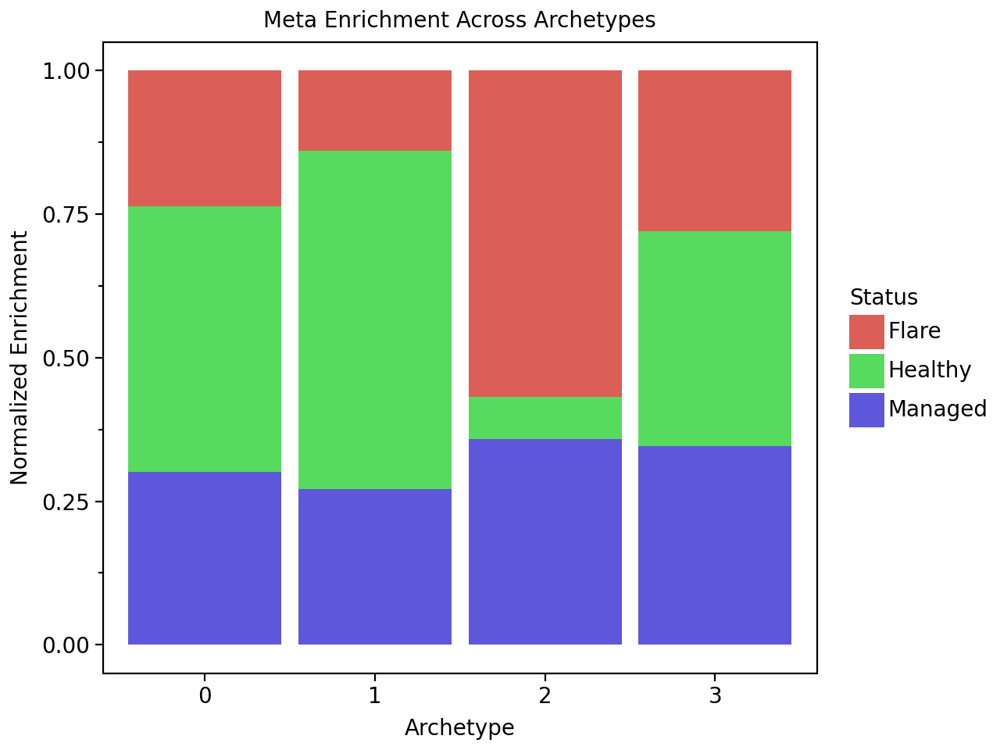

In [14]:
pt.barplot_meta_enrichment(status_enrichment, meta="Status")

## Functional Enrichment of the Archetypes

After obtaining the representative gene expression profiles for each archetype, functional enrichment analysis can be performed. I will use MSigDB’s Gene Ontology (GO) Biological Processes gene sets, as these categories tend to be relatively specific and concise, facilitating the identification of meaningful enriched processes.

In [24]:
geneset_to_remove = ["GOBP_NEUROGENESIS", "GOBP_GENERATION_OF_NEURONS", "GOBP_HEART_DEVELOPMENT", "GOBP_ENZYME_LINKED_RECEPTOR_PROTEIN_SIGNALING_PATHWAY"]

msigdb_raw = dc.op.resource("MSigDB")
msigdb = msigdb_raw[msigdb_raw["collection"]=="go_biological_process"]
msigdb = msigdb[~msigdb.duplicated(["geneset", "genesymbol"])]
msigdb = msigdb[~msigdb["geneset"].isin(geneset_to_remove)].copy()
msigdb = msigdb.drop_duplicates()
msigdb = msigdb.rename(columns={"geneset": "source", "genesymbol": "target"})

Now, I apply decoupler’s ULM method to calculate enrichment scores for the GO processes across each archetype.

In [25]:
acts_ulm_est, acts_ulm_est_p = dc.mt.ulm(data = archetype_expression,
                                          net = msigdb,
                                          verbose = True)

2025-06-05 22:27:11 | [INFO] ulm - Running ulm
2025-06-05 22:27:11 | [INFO] Extracted omics mat with 4 rows (observations) and 18496 columns (features)
2025-06-05 22:27:11 | [WARNING] weight not found in net.columns, adding it as:
net['weight'] = 1
2025-06-05 22:27:12 | [INFO] Network adjacency matrix has 12397 unique features and 6906 unique sources
2025-06-05 22:27:13 | [INFO] ulm - fitting 6906 univariate models of 18496 observations (targets) with 18494 degrees of freedom
2025-06-05 22:27:13 | [INFO] ulm - adjusting p-values by FDR
2025-06-05 22:27:13 | [INFO] ulm - done


The estimated activity scores are stored in acts_ulm_est, and the corresponding p-values are saved in acts_ulm_est_p. The top 25 enriched and statistically significant pathways are extracted using the following approach:

In [26]:
top_processes = pt.extract_enriched_processes(est=acts_ulm_est, 
                                                     pval=acts_ulm_est_p, 
                                                     order="desc", 
                                                     n=25, 
                                                     p_threshold=0.05)

In [27]:
top_processes[1]

,Process,0,1,2,3,specificity
0,GOBP_CYTOPLASMIC_TRANSLATION,6.324068,15.208863,-19.294693,42.580239,-27.371377
1,GOBP_POSITIVE_REGULATION_OF_RNA_METABOLIC_PROCESS,-4.005603,13.179614,2.458585,8.589553,4.590061
2,GOBP_POSITIVE_REGULATION_OF_MACROMOLECULE_BIOS...,-3.355228,12.310650,2.315046,9.773753,2.536897
3,GOBP_POSITIVE_REGULATION_OF_TRANSCRIPTION_BY_R...,-5.197782,11.121925,1.150106,5.883001,5.238924
4,GOBP_CHROMATIN_ORGANIZATION,2.584383,11.055012,-0.700543,3.440922,7.614090
5,GOBP_NEGATIVE_REGULATION_OF_NUCLEOBASE_CONTAIN...,-3.335256,10.884386,1.187299,6.150468,4.733918
6,GOBP_NEGATIVE_REGULATION_OF_BIOSYNTHETIC_PROCESS,-3.725531,10.722774,1.418769,7.054328,3.668446
7,GOBP_MRNA_METABOLIC_PROCESS,2.804367,9.853501,3.281186,9.103727,0.749773
8,GOBP_NEGATIVE_REGULATION_OF_RNA_BIOSYNTHETIC_P...,-3.409572,9.746189,0.930522,4.658581,5.087608
9,GOBP_PEPTIDE_BIOSYNTHETIC_PROCESS,4.229477,9.507563,-5.111056,29.055081,-19.547518


In [28]:
top_processes[2]

,Process,0,1,2,3,specificity
0,GOBP_NEGATIVE_REGULATION_OF_VIRAL_GENOME_REPLI...,-16.814832,-14.620496,28.628084,-6.415278,35.043362
1,GOBP_NEGATIVE_REGULATION_OF_VIRAL_PROCESS,-19.046172,-14.131628,28.209615,-2.760636,30.970251
2,GOBP_DEFENSE_RESPONSE_TO_SYMBIONT,-18.781166,-10.085032,27.008945,-0.494291,27.503236
3,GOBP_DEFENSE_RESPONSE_TO_OTHER_ORGANISM,-22.563007,-8.860083,26.899202,9.585345,17.313857
4,GOBP_INNATE_IMMUNE_RESPONSE,-20.814018,-9.414266,26.480816,8.387661,18.093155
5,GOBP_BIOLOGICAL_PROCESS_INVOLVED_IN_INTERSPECI...,-22.891183,-7.732453,26.268448,12.966115,13.302333
6,GOBP_RESPONSE_TO_VIRUS,-18.422646,-8.428391,25.392817,2.364251,23.028567
7,GOBP_DEFENSE_RESPONSE,-23.466212,-8.030462,25.279318,11.642486,13.636832
8,GOBP_IMMUNE_RESPONSE,-23.244331,-8.159806,24.625871,13.727416,10.898455
9,GOBP_REGULATION_OF_VIRAL_PROCESS,-18.552640,-11.317154,23.654748,3.262550,20.392198


The results are visualized in the following bar plots:

/home/hd/hd_hd/hd_fb235/.conda/envs/partipy/lib/python3.11/site-packages/IPython/lib/pretty.py:794: FutureWarning: Using repr(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
2025-06-05 22:27:13 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


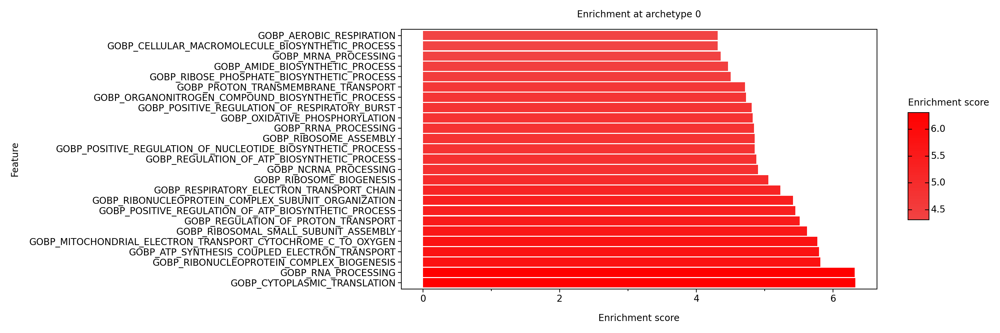

/home/hd/hd_hd/hd_fb235/.conda/envs/partipy/lib/python3.11/site-packages/IPython/lib/pretty.py:794: FutureWarning: Using repr(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
2025-06-05 22:27:14 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


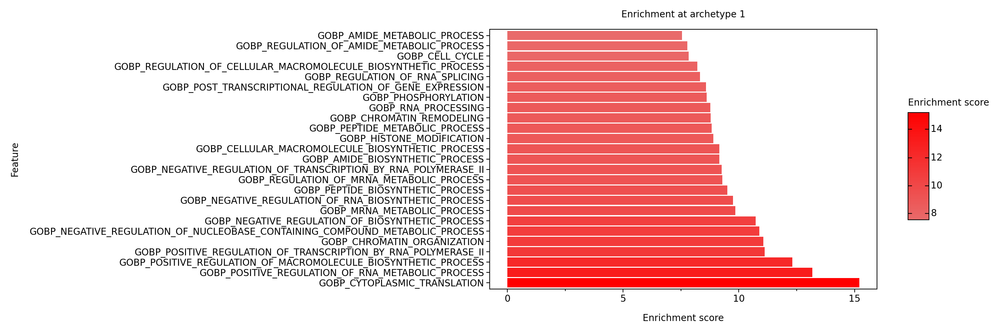

/home/hd/hd_hd/hd_fb235/.conda/envs/partipy/lib/python3.11/site-packages/IPython/lib/pretty.py:794: FutureWarning: Using repr(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
2025-06-05 22:27:14 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


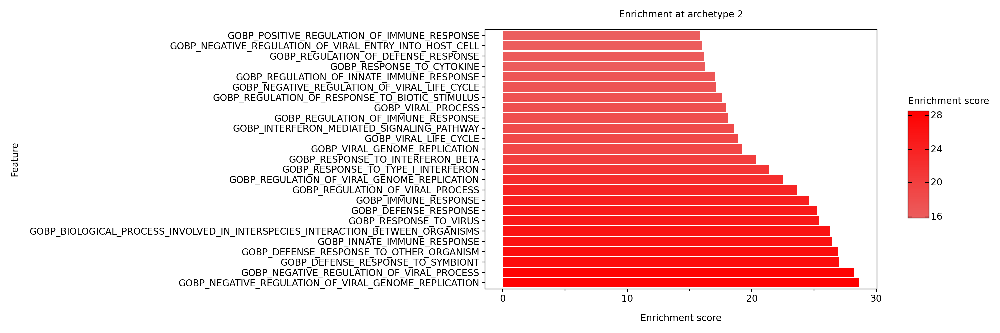

/home/hd/hd_hd/hd_fb235/.conda/envs/partipy/lib/python3.11/site-packages/IPython/lib/pretty.py:794: FutureWarning: Using repr(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
2025-06-05 22:27:15 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


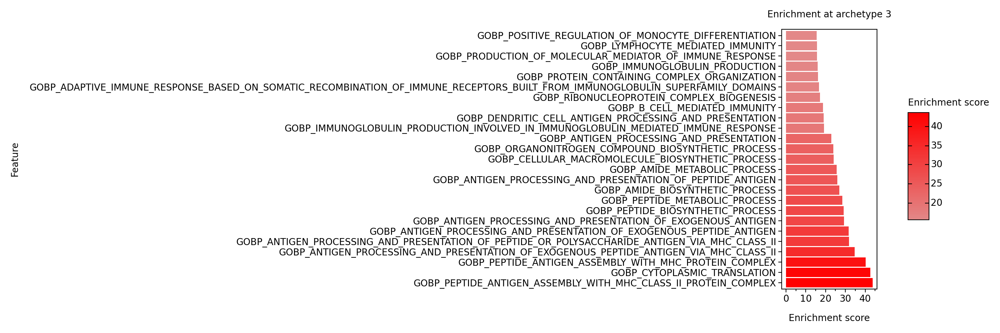

[<Figure Size: (1500 x 500)>,
 <Figure Size: (1500 x 500)>,
 <Figure Size: (1500 x 500)>,
 <Figure Size: (1500 x 500)>]

In [29]:
pt.barplot_functional_enrichment(top_processes, show=False)

Instead of selecting the top 25 most enriched GO processes, i can additionally extract and plot those with the highest specificity scores, highlighting pathways most uniquely associated with each archetype.

In [37]:
specific_processes = pt.extract_specific_processes(est=acts_ulm_est,
                                                          pval=acts_ulm_est_p, 
                                                          n=10,
                                                          p_threshold=0.05)
with open('Plots/specific_processes_ncM.pkl', 'wb') as f:
    pickle.dump(specific_processes, f)

In [31]:
specific_processes[1]

,Process,0,1,2,3,specificity
0,GOBP_CHROMATIN_ORGANIZATION,2.584383,11.055012,-0.700543,3.440922,7.614090
1,GOBP_CHROMATIN_REMODELING,2.082137,8.790805,-1.019958,2.486984,6.303821
2,GOBP_ANIMAL_ORGAN_MORPHOGENESIS,-1.924647,4.268333,-2.737770,-1.808203,6.076536
3,GOBP_CELL_MORPHOGENESIS,-1.075914,5.587614,-0.410931,-0.359516,5.947130
4,GOBP_NEGATIVE_REGULATION_OF_TRANSCRIPTION_BY_R...,-3.053344,9.264291,-0.180577,3.318703,5.945588
5,GOBP_CELL_CELL_SIGNALING_BY_WNT,0.276806,6.033479,-1.933852,0.258461,5.756673
6,GOBP_REGULATION_OF_SMALL_GTPASE_MEDIATED_SIGNA...,-0.981628,5.488209,-0.514016,-0.033727,5.521936
7,GOBP_CELL_MORPHOGENESIS_INVOLVED_IN_DIFFERENTI...,-0.818313,4.597555,-1.309304,-1.792514,5.415868
8,GOBP_CELLULAR_COMPONENT_MORPHOGENESIS,-1.948332,4.567265,-1.311197,-0.788938,5.356203
9,GOBP_REGULATION_OF_WNT_SIGNALING_PATHWAY,0.741111,6.050284,-2.119639,0.453596,5.309173


In [32]:
specific_processes[2]

,Process,0,1,2,3,specificity
0,GOBP_NEGATIVE_REGULATION_OF_VIRAL_GENOME_REPLI...,-16.814832,-14.620496,28.628084,-6.415278,35.043362
1,GOBP_NEGATIVE_REGULATION_OF_VIRAL_PROCESS,-19.046172,-14.131628,28.209615,-2.760636,30.970251
2,GOBP_DEFENSE_RESPONSE_TO_SYMBIONT,-18.781166,-10.085032,27.008945,-0.494291,27.503236
3,GOBP_REGULATION_OF_VIRAL_GENOME_REPLICATION,-15.013208,-9.113902,22.476454,-2.898057,25.374511
4,GOBP_RESPONSE_TO_TYPE_I_INTERFERON,-12.557960,-9.236444,21.363583,-3.840505,25.204089
5,GOBP_RESPONSE_TO_INTERFERON_BETA,-11.723383,-11.929464,20.330664,-3.251767,23.582431
6,GOBP_RESPONSE_TO_VIRUS,-18.422646,-8.428391,25.392817,2.364251,23.028567
7,GOBP_INTERFERON_MEDIATED_SIGNALING_PATHWAY,-11.283454,-7.965520,18.574569,-2.228097,20.802665
8,GOBP_REGULATION_OF_VIRAL_PROCESS,-18.552640,-11.317154,23.654748,3.262550,20.392198
9,GOBP_VIRAL_GENOME_REPLICATION,-12.695215,-6.778675,19.214017,0.016430,19.197586


2025-06-05 22:27:15 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


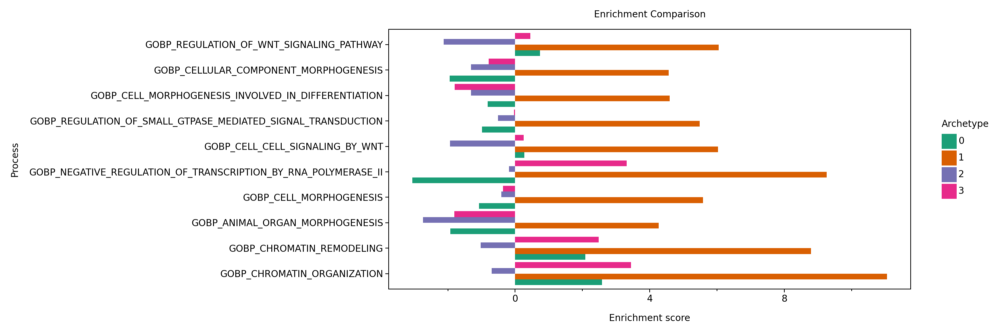

In [33]:
pt.barplot_enrichment_comparison(specific_processes[1]) + pn.theme(figure_size=(15, 5))

2025-06-05 22:27:16 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


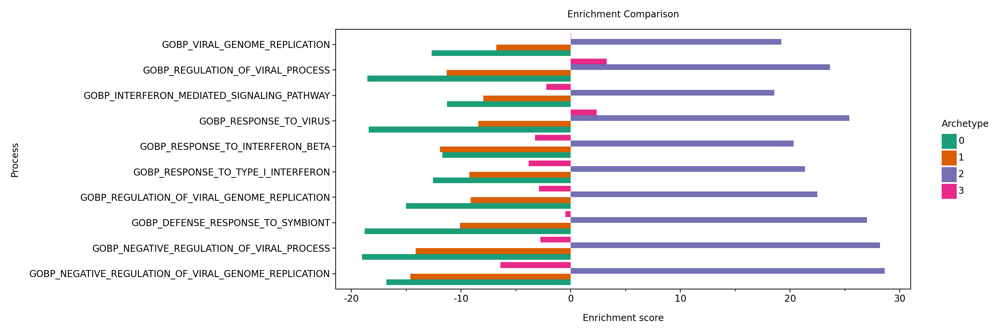

In [34]:
pt.barplot_enrichment_comparison(specific_processes[2]) + pn.theme(figure_size=(15, 5))

We focus our downstream analysis on Archetype 2, which exhibits a strong association with flare samples, as shown by the meta-enrichment analysis. Among all identified archetypes, Archetype 2 contains the highest proportion of cells derived from patients experiencing disease flare, suggesting it captures a transcriptional state that is characteristic of active lupus pathology.

Functional enrichment analysis further supports this interpretation. Archetype 2 is specifically enriched for gene ontology (GO) terms involved in antiviral defense and interferon signaling, including:

- Negative regulation of viral genome replication

- Defense response to symbiont

- Response to type I interferon

- Interferon-beta signaling

- Interferon-mediated signaling pathway

These pathways are highly specific to Archetype 2 and reflect a coordinated immune response centered on type I interferon activity, a well-established driver of SLE flares.

This functional profile is consistent with our earlier gene-level observations. The lower-right region of the PCA—where Archetype 2 is spatially represented—is enriched for the expression of classical interferon-stimulated genes (ISGs) such as IFI27, IFITM3, and ISG15:

- IFI27 is involved in pyroptotic inflammation and antiviral response.

- IFITM3 restricts viral entry into host cells and is upregulated in SLE.

- ISG15 contributes to the innate immune response through interferon-induced ubiquitin-like modification.

Together, these findings form a coherent narrative: Archetype 2 defines a flare-associated immune state, transcriptionally characterized by heightened type I interferon responses and antiviral defense mechanisms. The convergence of condition enrichment, pathway analysis, and ISG expression strongly supports the biological relevance of this archetype in the context of lupus flares.

In [ ]:
df = archetype_expression.T.copy()
df.columns = df.columns.astype(str)
leading_genes_arch = {}

for arch_ind in range(0, 3):
    leading_genes_arch[arch_ind] = []
    for process_name in specific_processes[arch_ind]["Process"][:3]:
        _, le = dc.pl.leading_edge(
            df=df,
            net=msigdb,
            stat=str(arch_ind),
            name = process_name
        )
        leading_genes_arch[arch_ind].append((process_name, le))

In [27]:
{k: leading_genes_arch[k] for k in [1, 2] if k in leading_genes_arch}

{1: [('GOBP_CHROMATIN_ORGANIZATION',
   array(['NAP1L1', 'PRKCB', 'CDKN1C', 'DDX21', 'KMT2C', 'ZBTB7A', 'JMJD1C',
          'H3-3A', 'HP1BP3', 'CHD2', 'TSPYL2', 'EP300', 'HNRNPU', 'BPTF',
          'RERE', 'H1-10', 'BRD2', 'NFAT5', 'WAC', 'TRIP12', 'NR3C1', 'EPC1',
          'USP7', 'ASH1L', 'TBL1XR1', 'USP3', 'RYBP', 'CHD4', 'UBR5',
          'ARID1A', 'YTHDC1', 'KANSL1', 'PSME4', 'TET2', 'RBL2', 'KDM2A',
          'MBD2', 'BAZ2A', 'INO80D', 'KMT2A', 'SMARCA2', 'ARID4A', 'KAT6B',
          'KAT6A', 'YY1', 'ZZEF1', 'ATF7IP', 'ARID1B', 'ARID2', 'ANP32B',
          'CHD1', 'SF3B1', 'KMT2E', 'SATB1', 'KDM5A', 'H1-4', 'ING3', 'CHD3',
          'OGT', 'SET', 'DYRK1A', 'RNF168', 'USP16', 'JARID2', 'UBN1',
          'ATRX', 'SMCHD1', 'RAD21', 'SUPT6H', 'SIN3A', 'SPTY2D1', 'CTBP1',
          'KDM6B', 'MSL1', 'SETD2', 'BRD9', 'MYSM1', 'CBX4', 'SETD1B',
          'CBX6', 'ZNF335', 'USP22', 'EPC2', 'SMARCC1', 'RCOR1', 'MIER1',
          'KDM6A', 'KMT2D', 'SUPT5H', 'HCFC1', 'KDM1B', 'MSL2', 'BAZ2B

In [ ]:
# adata.write_h5ad( "./DataAnalysis/adata_ncMRun.h5ad")